# RBPj 10X analysis
## January 2022
## Yolanda Guillén

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sns
import scrublet as scr

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

-----
anndata     0.7.8
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                         8.4.0
anndata                     0.7.8
appnope                     0.1.2
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
cached_property             1.5.2
cffi                        1.15.0
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.2
dask                        2021.12.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   4.4.2
defusedxml                  0.7.1
entrypoints                 0.3
fsspec                      2021.11.1
h5py                        3.6.0
igraph                      0.9.8
ipykernel                   6.6.1
ipython_genutils            0.2.0
jedi                        0.18.1
jinja2                      3.0.3
joblib                      1.1.0
kiwisolver     

In [2]:
%matplotlib inline

In [3]:
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 
cmap2 = LinearSegmentedColormap.from_list(name='gene_cmap2', colors=['lightgrey', 'lavender', 'blue', 'darkblue']) 
sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)
sc.logging.print_versions()

-----
anndata     0.7.8
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                         8.4.0
anndata                     0.7.8
appnope                     0.1.2
attr                        21.4.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
cached_property             1.5.2
cffi                        1.15.0
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.2
dask                        2021.12.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   4.4.2
defusedxml                  0.7.1
entrypoints                 0.3
fsspec                      2021.11.1
h5py                        3.6.0
idna                        3.1
igraph                      0.9.8
importlib_resources         NA
ipykernel                   6.6.1
ipython_genutils            0.2.0
jedi                

In [4]:
adata_WT = sc.read_10x_mtx(
    '/Users/yolanda_guillen/Desktop/IMIM/sc_RBPj/10X_output/A0023/filtered_features/',var_names='gene_symbols', cache=True)                
    # the directory with the `.mtx.gz` file
    # use gene symbols for the variable names (variables-axis index)
    # write a cache file f

... reading from cache file cache/Users-yolanda_guillen-Desktop-IMIM-sc_RBPj-10X_output-A0023-filtered_features-matrix.h5ad


In [5]:
adata_KO = sc.read_10x_mtx(
    '/Users/yolanda_guillen/Desktop/IMIM/sc_RBPj/10X_output/A0024/filtered_features/',var_names='gene_symbols', cache=True)

... reading from cache file cache/Users-yolanda_guillen-Desktop-IMIM-sc_RBPj-10X_output-A0024-filtered_features-matrix.h5ad


In [6]:
# Concatenaded datasets
adata_all_concat = adata_WT.concatenate(adata_KO, batch_categories=['WT', 'KO'])

In [7]:
print(adata_WT)
print(adata_KO)
print(adata_all_concat)

AnnData object with n_obs × n_vars = 11452 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 4613 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 16065 × 32285
    obs: 'batch'
    var: 'gene_ids', 'feature_types'


normalizing counts per cell
    finished (0:00:00)


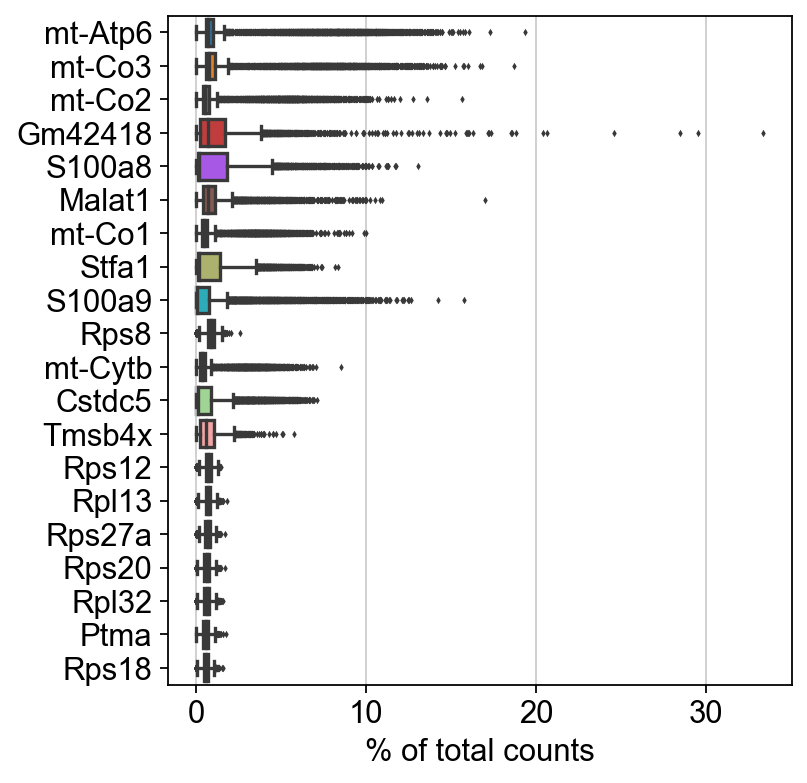

In [8]:
sc.pl.highest_expr_genes(adata_WT, n_top=20)

normalizing counts per cell
    finished (0:00:00)


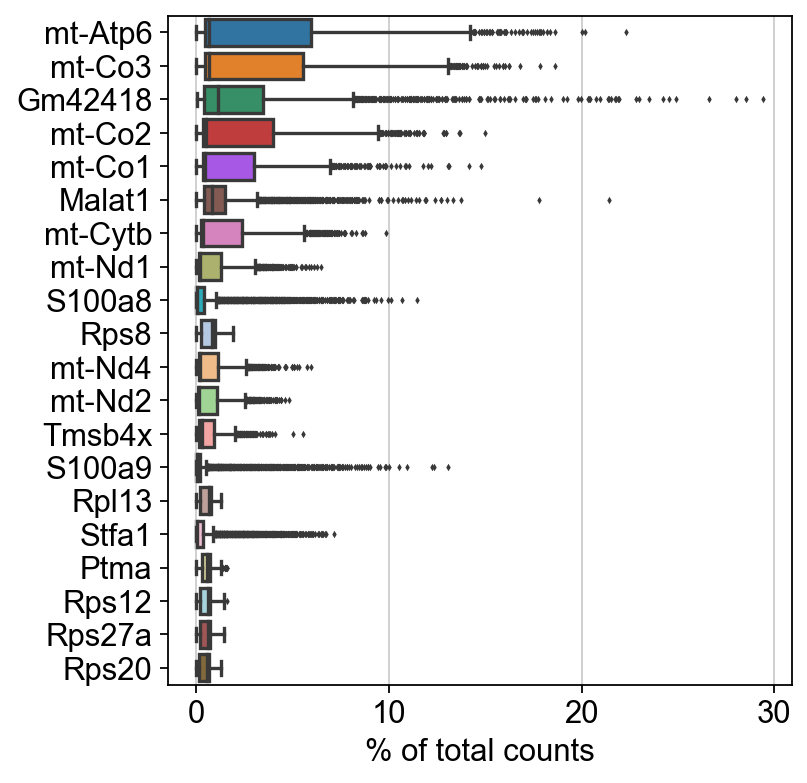

In [9]:
sc.pl.highest_expr_genes(adata_KO, n_top=20)

normalizing counts per cell
    finished (0:00:00)


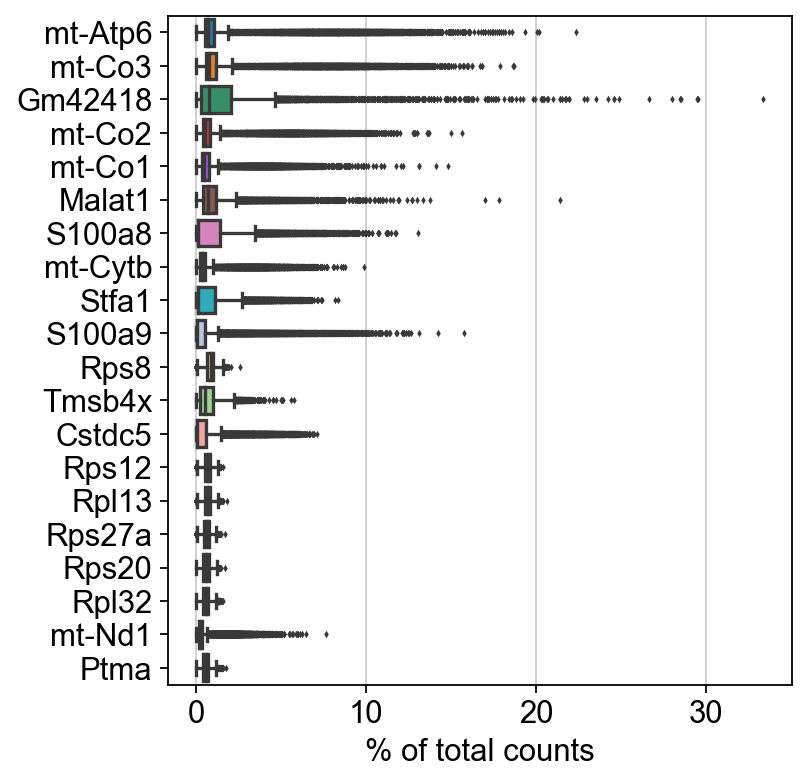

In [10]:
sc.pl.highest_expr_genes(adata_all_concat, n_top=20)

## QC

In [11]:
# Quality control metrics. If inplace = True, the output QC variables are added to adata.obs. If inplace = False,
# not included, only calculated and print.
sc.pp.calculate_qc_metrics(adata_WT,inplace=True,percent_top=[50])
# Output
# n_genes_by_counts = Number of genes expressed
# log1p_n_genes_by_counts = (logX + 1)
# total_counts = Sum of counts for a gene
# pct_counts_in_top_50_genes = cumulative percentage of counts for 50 most most expressed genes. If deprecated, it 
# pct_dropout_by_counts = percentage of cells this feature does not appear in.
# will estimate for a range of top genes.


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [12]:
sc.pp.calculate_qc_metrics(adata_KO,inplace=True,percent_top=[50])

In [13]:
sc.pp.calculate_qc_metrics(adata_all_concat,inplace=True,percent_top=[50])

/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

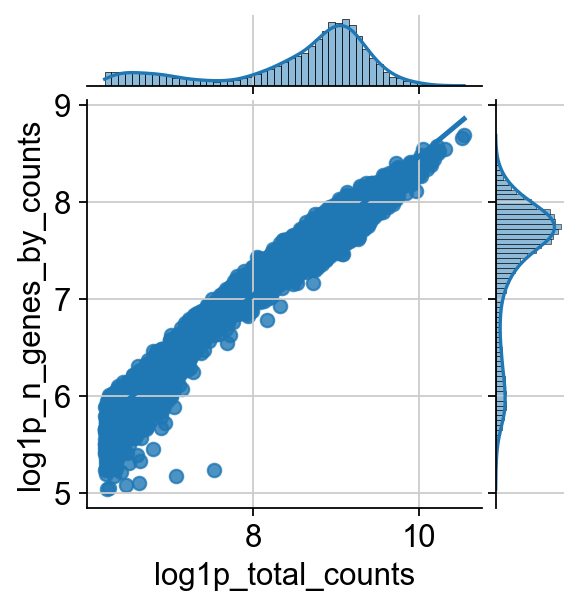

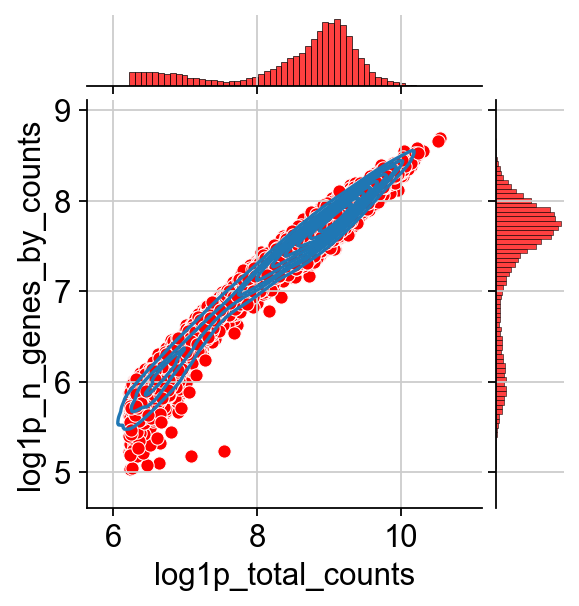

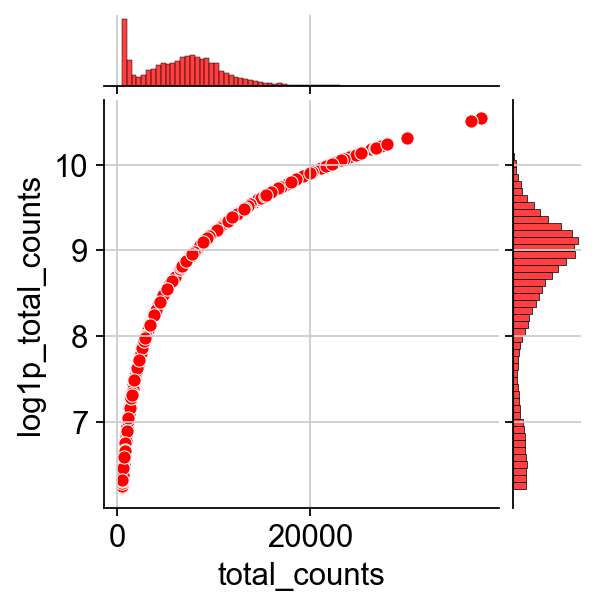

In [14]:
#print(adata.obs)
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_WT.obs,kind="reg",height=4)
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_WT.obs,color="red",height=4).plot_joint(sns.kdeplot)
sns.jointplot("total_counts","log1p_total_counts",
            data=adata_WT.obs,color="red",height=4)



/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

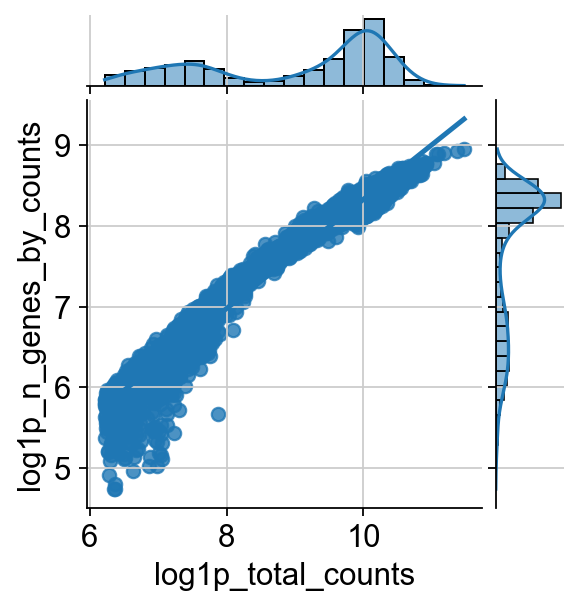

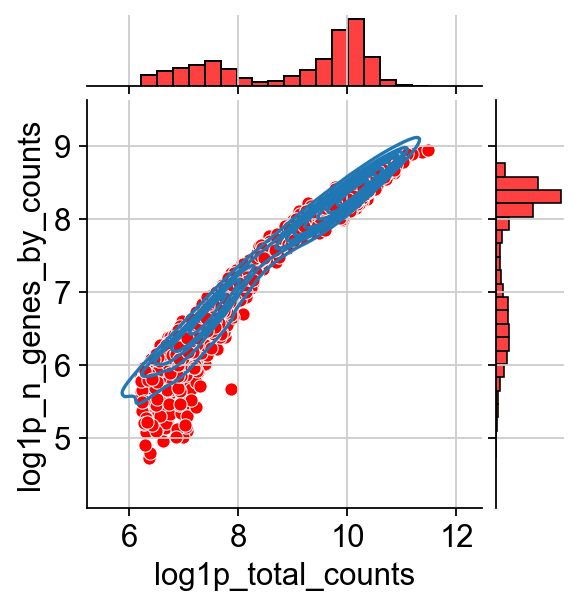

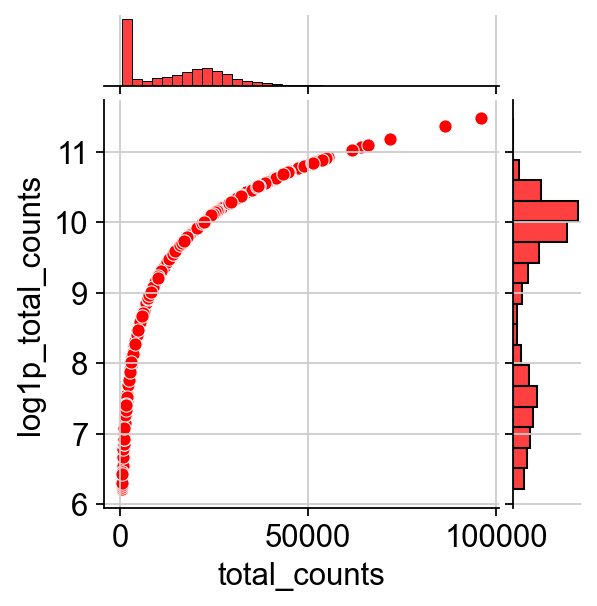

In [15]:
#print(adata.obs)
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_KO.obs,kind="reg",height=4)
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_KO.obs,color="red",height=4).plot_joint(sns.kdeplot)
sns.jointplot("total_counts","log1p_total_counts",
            data=adata_KO.obs,color="red",height=4)



/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

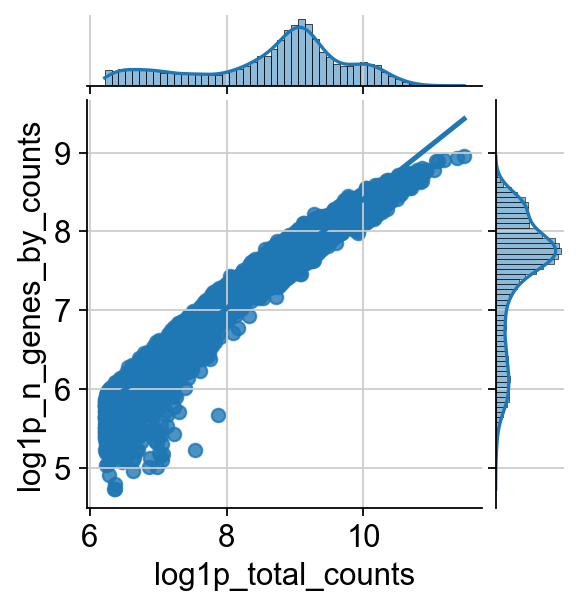

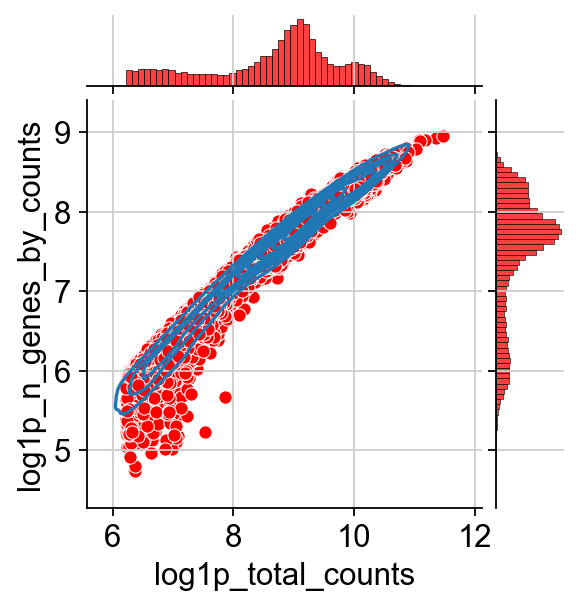

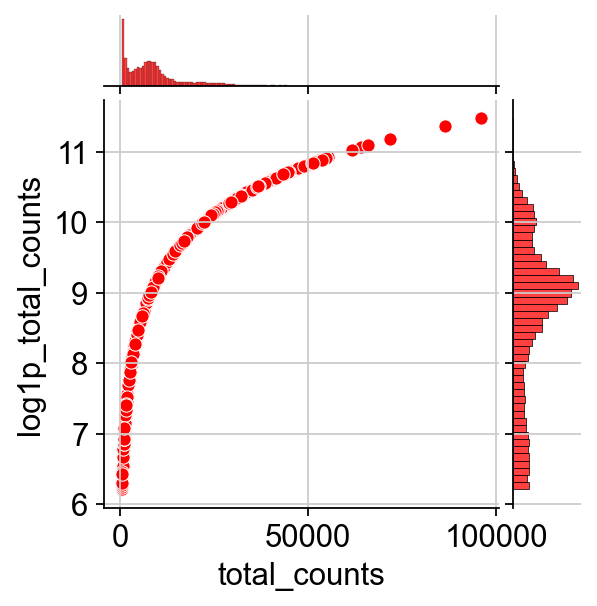

In [16]:
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_all_concat.obs,kind="reg",height=4)
sns.jointplot("log1p_total_counts","log1p_n_genes_by_counts",
            data=adata_all_concat.obs,color="red",height=4).plot_joint(sns.kdeplot)
sns.jointplot("total_counts","log1p_total_counts",
            data=adata_all_concat.obs,color="red",height=4)

In [17]:
adata_WT.obs['total_counts']
adata_KO.obs['total_counts']
adata_all_concat.obs['total_counts']

AAACCCAAGACCGCCT-1-WT     9069.0
AAACCCAAGCATGCGA-1-WT      727.0
AAACCCAAGCCATATC-1-WT     5642.0
AAACCCACAGAGAGGG-1-WT    11092.0
AAACCCACAGGCAATG-1-WT      942.0
                          ...   
TTTGGAGGTTGGTGTT-1-KO     1183.0
TTTGGTTAGCCTAGGA-1-KO    10025.0
TTTGGTTTCCTACCAC-1-KO    36752.0
TTTGTTGAGCAGGGAG-1-KO    22246.0
TTTGTTGGTACTCAAC-1-KO    29401.0
Name: total_counts, Length: 16065, dtype: float32

/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

<AxesSubplot:xlabel='total_counts', ylabel='Density'>

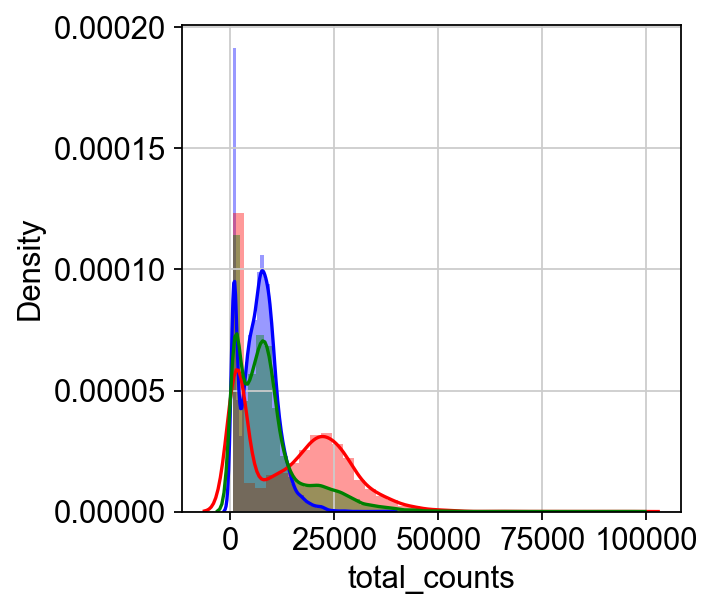

In [18]:
#sns.distplot(adata_Don.obs["total_counts"])
sns.distplot(adata_WT.obs["total_counts"],color="blue")
sns.distplot(adata_KO.obs["total_counts"],color="red")
sns.distplot(adata_all_concat.obs["total_counts"],color="green")
#adata_Don.obs

/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

<AxesSubplot:xlabel='pct_counts_in_top_50_genes', ylabel='Density'>

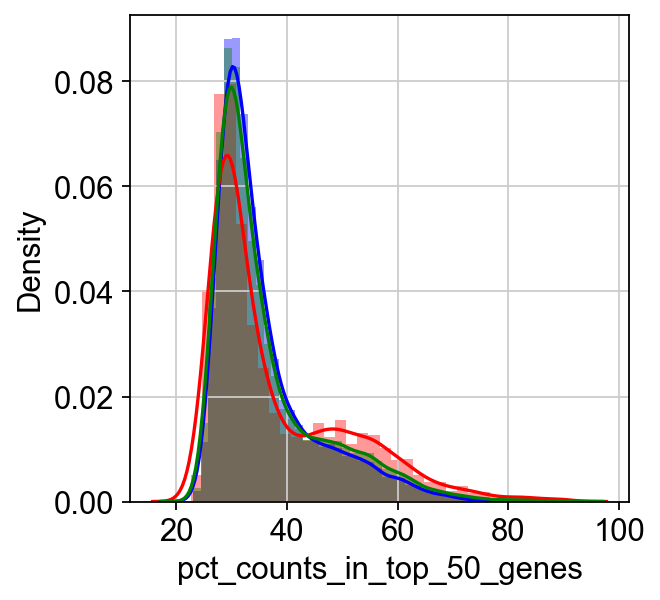

In [19]:
sns.distplot(adata_WT.obs["pct_counts_in_top_50_genes"],color="blue")
sns.distplot(adata_KO.obs["pct_counts_in_top_50_genes"],color="red")
sns.distplot(adata_all_concat.obs["pct_counts_in_top_50_genes"],color="green")

In [20]:
# filter cells and genes here based on user preference
sc.pp.filter_cells(adata_WT, min_genes=100)
sc.pp.filter_genes(adata_WT, min_cells=1)

filtered out 13610 genes that are detected in less than 1 cells


In [21]:
sc.pp.filter_cells(adata_KO, min_genes=50)
sc.pp.filter_genes(adata_KO, min_cells=1)

filtered out 13855 genes that are detected in less than 1 cells


In [22]:
sc.pp.filter_cells(adata_all_concat, min_genes=50)
sc.pp.filter_genes(adata_all_concat, min_cells=1)

filtered out 12580 genes that are detected in less than 1 cells


In [23]:
print(adata_WT.shape)
print(adata_KO.shape)
print(adata_all_concat.shape)

(11452, 18675)
(4613, 18430)
(16065, 19705)


In [24]:
# look at mit contents
mito_genes = [name for name in adata_WT.var_names if name.startswith('mt-')]
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata_WT.obs['percent_mito'] = np.sum(
    adata_WT[:, mito_genes].X, axis=1).A1 / np.sum(adata_WT.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata_WT.obs['n_counts'] = adata_WT.X.sum(axis=1).A1

In [25]:
mito_genes = [name for name in adata_KO.var_names if name.startswith('mt-')]
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata_KO.obs['percent_mito'] = np.sum(
    adata_KO[:, mito_genes].X, axis=1).A1 / np.sum(adata_KO.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata_KO.obs['n_counts'] = adata_KO.X.sum(axis=1).A1

In [26]:
mito_genes = [name for name in adata_all_concat.var_names if name.startswith('mt-')]
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata_all_concat.obs['percent_mito'] = np.sum(
    adata_all_concat[:, mito_genes].X, axis=1).A1 / np.sum(adata_all_concat.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata_all_concat.obs['n_counts'] = adata_all_concat.X.sum(axis=1).A1

/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

<AxesSubplot:xlabel='percent_mito', ylabel='Density'>

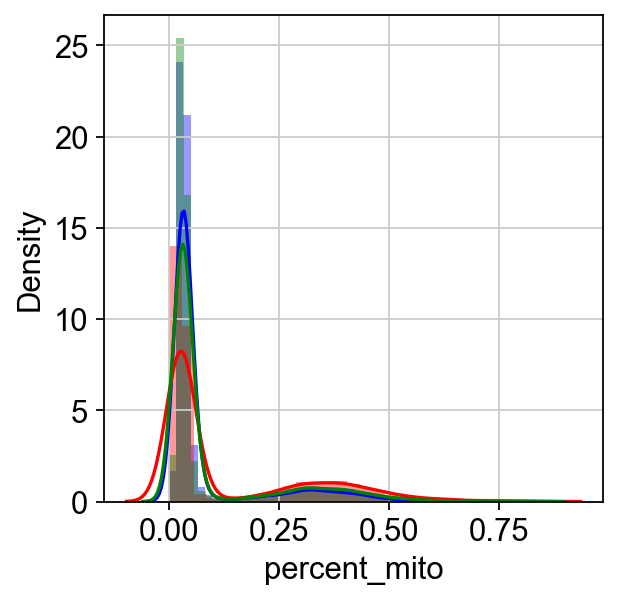

In [27]:
sns.distplot(adata_WT.obs["percent_mito"],color="blue")
sns.distplot(adata_KO.obs["percent_mito"],color="red")
sns.distplot(adata_all_concat.obs["percent_mito"],color="green")

... storing 'feature_types' as categorical


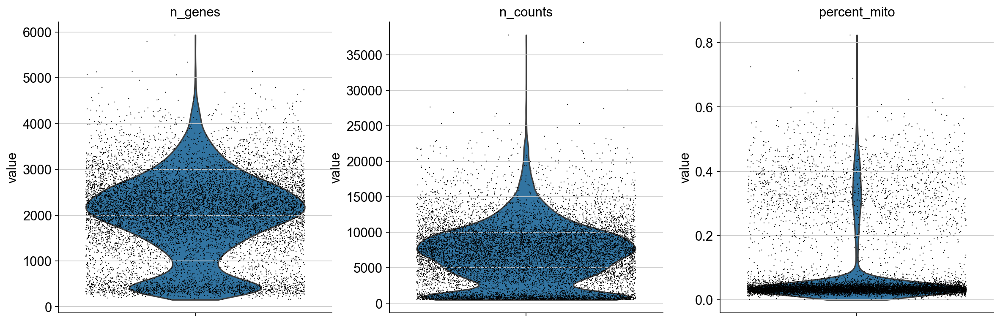

In [28]:
sc.pl.violin(adata_WT, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

... storing 'feature_types' as categorical


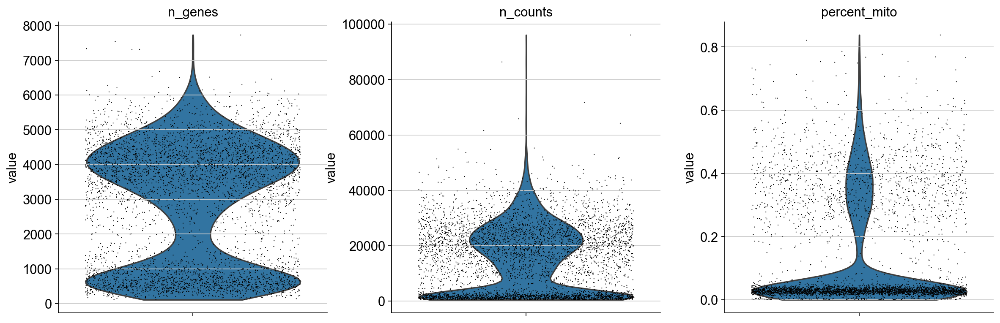

In [29]:
sc.pl.violin(adata_KO, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

... storing 'feature_types' as categorical


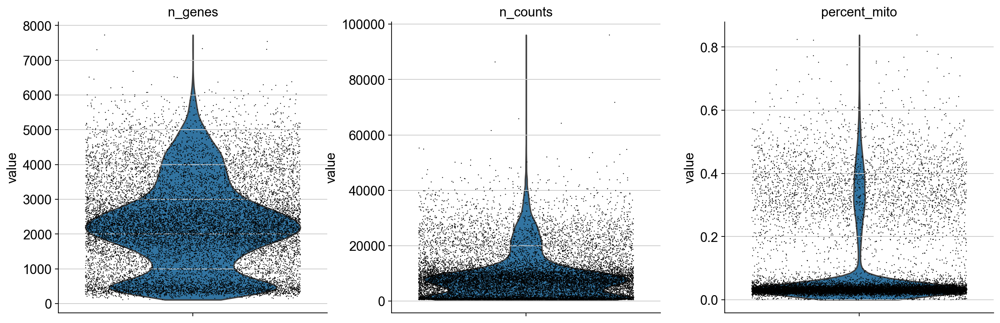

In [30]:
sc.pl.violin(adata_all_concat, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

In [31]:
adata_WT.obs.head(3)
adata_KO.obs.head(3)
adata_all_concat.obs.head(3)

,batch,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,n_genes,percent_mito,n_counts
AAACCCAAGACCGCCT-1-WT,WT,2526,7.834788,9069.0,9.112727,30.058441,2526,0.031646,9069.0
AAACCCAAGCATGCGA-1-WT,WT,418,6.037871,727.0,6.590301,46.905089,418,0.261348,727.0
AAACCCAAGCCATATC-1-WT,WT,2059,7.630461,5642.0,8.638171,28.447359,2059,0.031195,5642.0


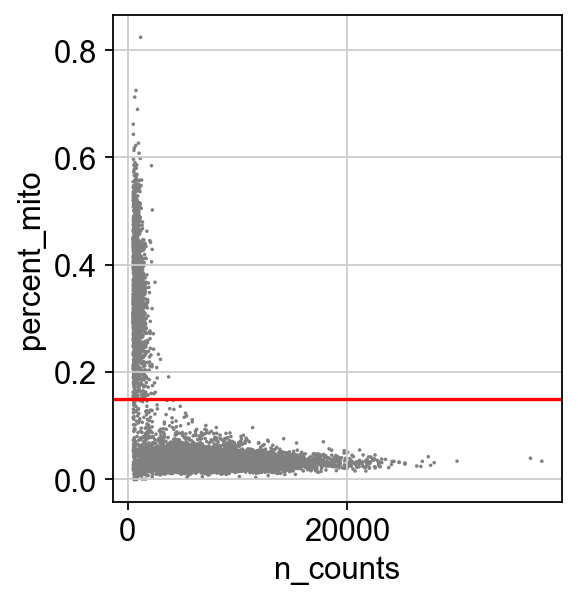

In [32]:
# mit percentage shows some dying cells, REMOVE them
ax = sc.pl.scatter(adata_WT, x='n_counts', y='percent_mito', show=False)
ax.axhline(y=0.15, c='red')


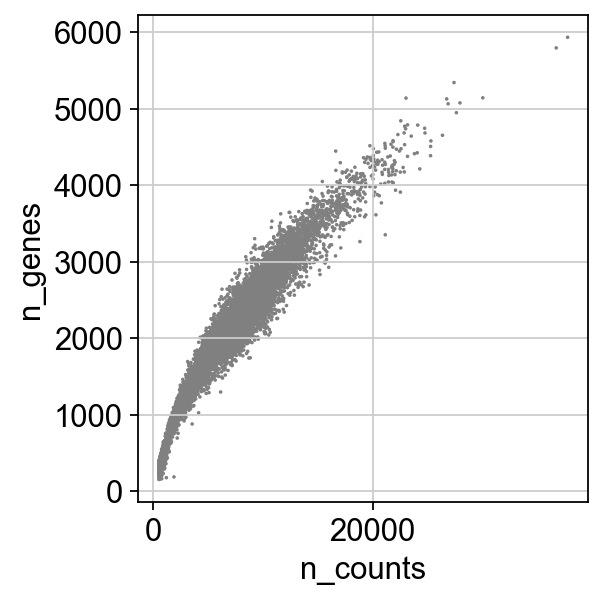

In [33]:
sc.pl.scatter(adata_WT, x='n_counts', y='n_genes')

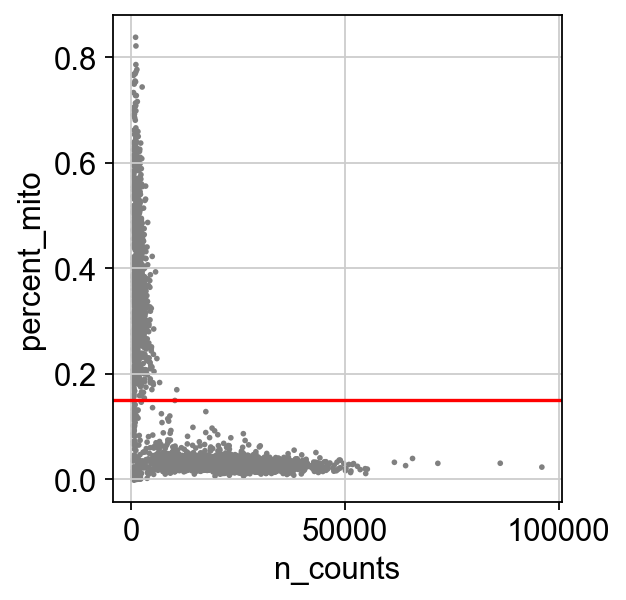

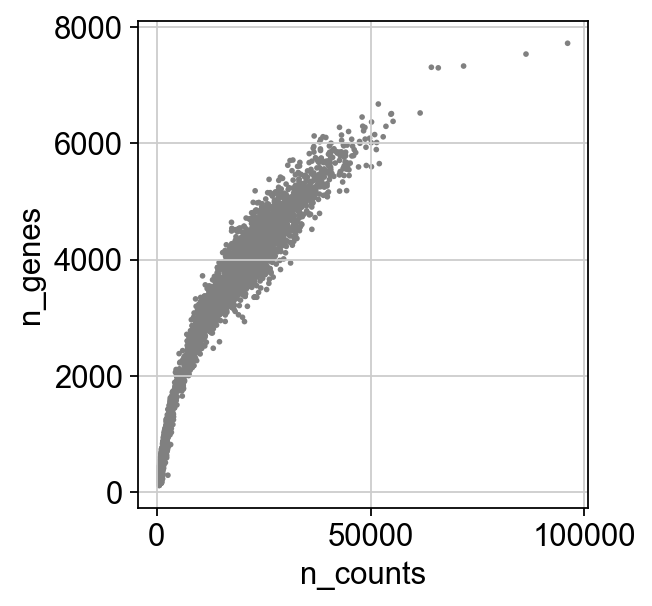

In [34]:
# mit percentage shows some dying cells, REMOVE them
ax = sc.pl.scatter(adata_KO, x='n_counts', y='percent_mito', show=False)
ax.axhline(y=0.15, c='red')
sc.pl.scatter(adata_KO, x='n_counts', y='n_genes')

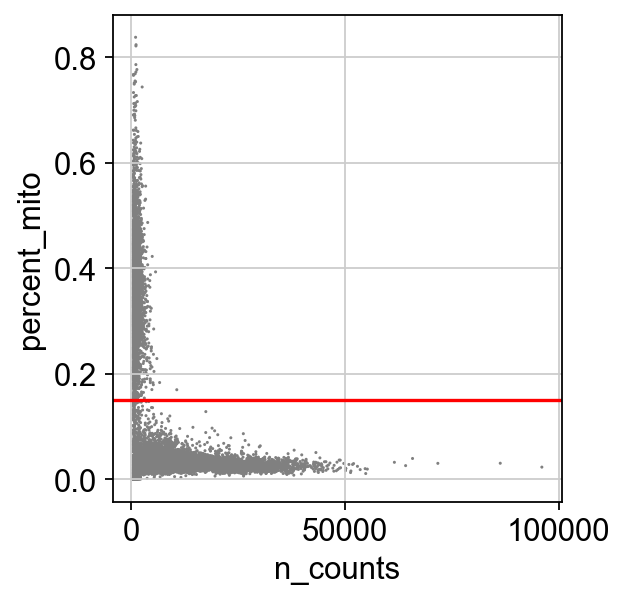

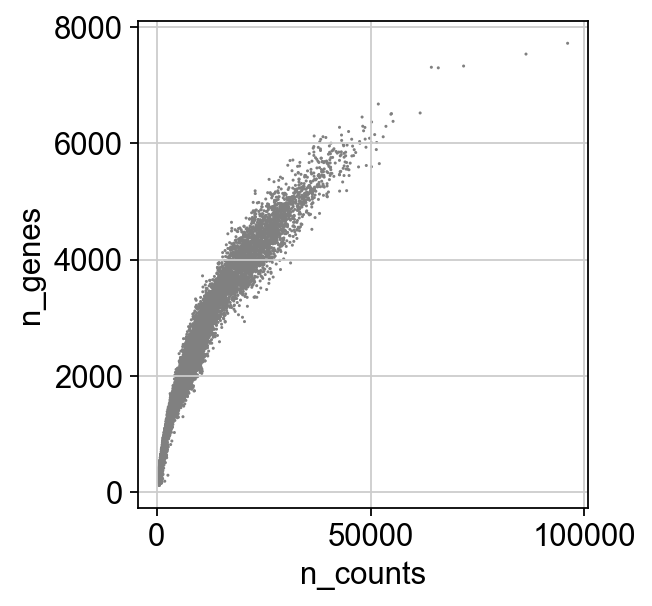

In [35]:
# mit percentage shows some dying cells, REMOVE them
ax = sc.pl.scatter(adata_all_concat, x='n_counts', y='percent_mito', show=False)
ax.axhline(y=0.15, c='red')
sc.pl.scatter(adata_all_concat, x='n_counts', y='n_genes')

In [36]:
# further QC with high mit percentage
adata_WT = adata_WT[adata_WT.obs['percent_mito'] < 0.15, :]
print(adata_WT.shape)

(9728, 18675)


In [37]:
# further QC with high mit percentage
adata_KO = adata_KO[adata_KO.obs['percent_mito'] < 0.15, :]
print(adata_KO.shape)

(3258, 18430)


In [38]:
# further QC with high mit percentage
adata_all_concat = adata_all_concat[adata_all_concat.obs['percent_mito'] < 0.15, :]
print(adata_all_concat.shape)

(12986, 19705)


In [39]:
# Then calculate the doublet score to remove potential doublets
scrub_WT=scr.Scrublet(adata_WT.X)
adata_WT.obs['doublet_scores'], adata_WT.obs['predicted_doublets'] = scrub_WT.scrub_doublets()


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.40
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 41.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.9%
Elapsed time: 17.4 seconds


In [40]:
# Then calculate the doublet score to remove potential doublets
scrub_KO=scr.Scrublet(adata_KO.X)
adata_KO.obs['doublet_scores'], adata_KO.obs['predicted_doublets'] = scrub_KO.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.46
Detected doublet rate = 1.7%
Estimated detectable doublet fraction = 30.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.6%
Elapsed time: 6.7 seconds


In [41]:
scrub_all_concat=scr.Scrublet(adata_all_concat.X)
adata_all_concat.obs['doublet_scores'], adata_all_concat.obs['predicted_doublets'] = scrub_all_concat.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...


Trying to set attribute `.obs` of view, copying.


Automatically set threshold at doublet score = 0.37
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 37.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 7.8%
Elapsed time: 30.7 seconds


In [42]:
adata_WT.obs.predicted_doublets.astype('category')

AAACCCAAGACCGCCT-1    False
AAACCCAAGCCATATC-1    False
AAACCCACAGAGAGGG-1     True
AAACCCACAGGTTCGC-1    False
AAACCCACATACTTTC-1    False
                      ...  
TTTGTTGAGCTTTGTG-1    False
TTTGTTGAGGTCGACA-1    False
TTTGTTGCAACCGATT-1    False
TTTGTTGCAACGATCT-1    False
TTTGTTGCACGTAGAG-1    False
Name: predicted_doublets, Length: 9728, dtype: category
Categories (2, object): [False, True]

In [43]:
adata_KO.obs.predicted_doublets.astype('category')

AAACCCACAACGGTAG-1    False
AAACCCACACACCTAA-1    False
AAACGAAAGCCTTGAT-1    False
AAACGAAAGGGCAGAG-1    False
AAACGAACAATTGCCA-1    False
                      ...  
TTTGGAGAGCGTATAA-1    False
TTTGGTTAGCCTAGGA-1    False
TTTGGTTTCCTACCAC-1    False
TTTGTTGAGCAGGGAG-1    False
TTTGTTGGTACTCAAC-1    False
Name: predicted_doublets, Length: 3258, dtype: category
Categories (2, object): [False, True]

In [44]:
adata_all_concat.obs.predicted_doublets.astype('category')

AAACCCAAGACCGCCT-1-WT    False
AAACCCAAGCCATATC-1-WT    False
AAACCCACAGAGAGGG-1-WT     True
AAACCCACAGGTTCGC-1-WT    False
AAACCCACATACTTTC-1-WT    False
                         ...  
TTTGGAGAGCGTATAA-1-KO    False
TTTGGTTAGCCTAGGA-1-KO    False
TTTGGTTTCCTACCAC-1-KO    False
TTTGTTGAGCAGGGAG-1-KO    False
TTTGTTGGTACTCAAC-1-KO    False
Name: predicted_doublets, Length: 12986, dtype: category
Categories (2, object): [False, True]

/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/yolanda_guillen/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level func

<AxesSubplot:xlabel='doublet_scores', ylabel='Density'>

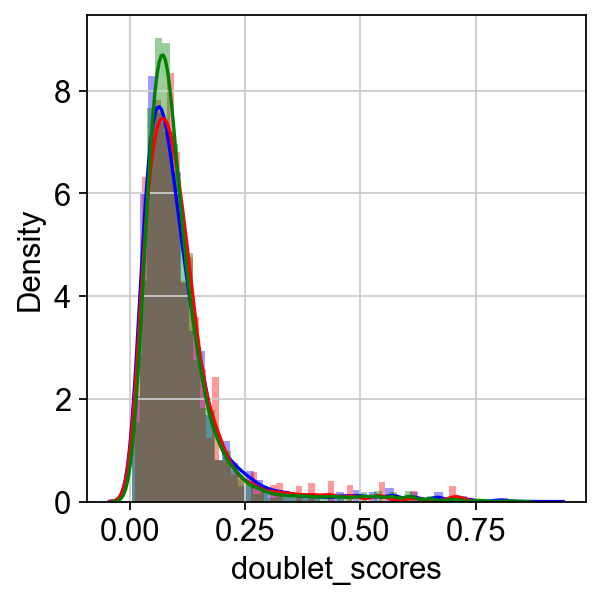

In [45]:
sns.distplot(adata_WT.obs["doublet_scores"],color="blue")
sns.distplot(adata_KO.obs["doublet_scores"],color="red")
sns.distplot(adata_all_concat.obs["doublet_scores"],color="green")

In [46]:
# Remove predicted doublets?

In [47]:
# normalisation
sc.pp.normalize_per_cell(adata_WT, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [48]:
# normalisation
sc.pp.normalize_per_cell(adata_KO, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [49]:
sc.pp.normalize_per_cell(adata_all_concat, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [50]:
# log counts
sc.pp.log1p(adata_WT)
sc.pp.log1p(adata_KO)
sc.pp.log1p(adata_all_concat)

In [51]:
adata_WT.raw = adata_WT

In [52]:
adata_KO.raw = adata_KO

In [53]:
adata_all_concat.raw = adata_all_concat

In [ ]:
adata_WT.write('./write/scRBPj_lognorm_afterQC.h5ad')

In [ ]:
adata_KO.write('./write/scRBPj_KO_lognorm_afterQC.h5ad')

In [54]:
# find highly variable genes
filter_result_WT = sc.pp.filter_genes_dispersion(
    adata_WT.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
print(sum(filter_result_WT.gene_subset))

extracting highly variable genes
    finished (0:00:01)
1164


In [55]:
# find highly variable genes
filter_result_KO = sc.pp.filter_genes_dispersion(
    adata_KO.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
print(sum(filter_result_KO.gene_subset))

extracting highly variable genes
    finished (0:00:01)
1989


In [56]:
# find highly variable genes
filter_result_all_concat = sc.pp.filter_genes_dispersion(
    adata_all_concat.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
print(sum(filter_result_all_concat.gene_subset))

extracting highly variable genes
    finished (0:00:01)
1247


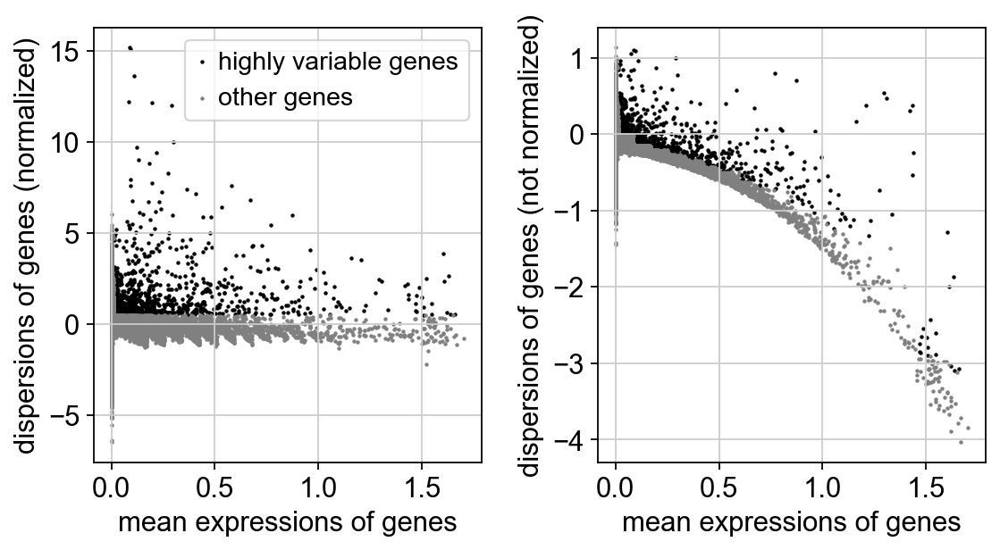

In [57]:
sc.pl.filter_genes_dispersion(filter_result_WT)

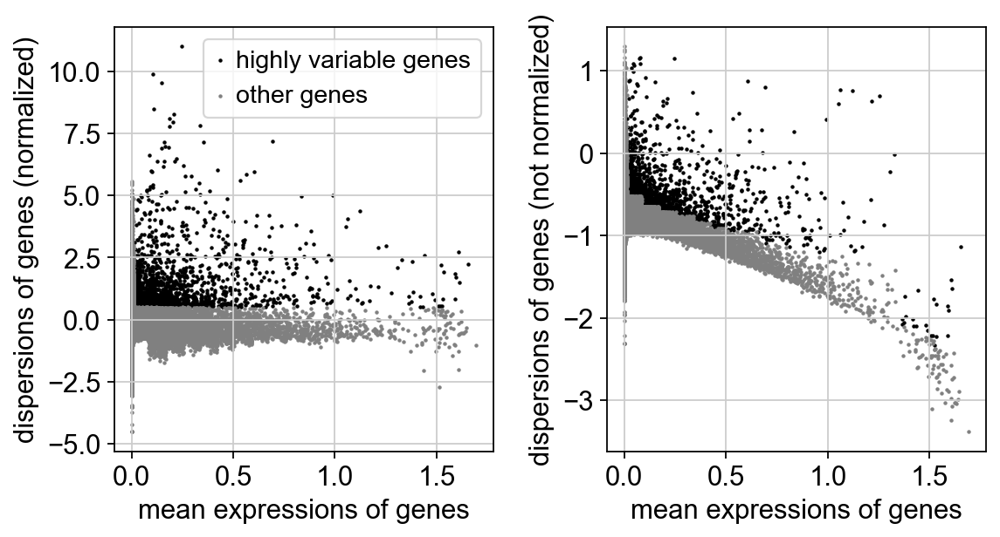

In [58]:
sc.pl.filter_genes_dispersion(filter_result_KO)

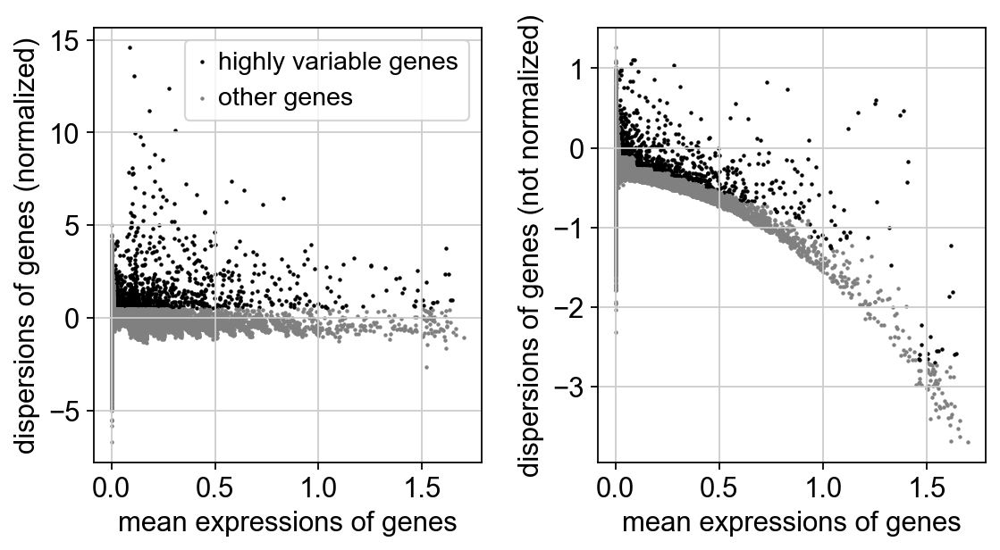

In [59]:
sc.pl.filter_genes_dispersion(filter_result_all_concat)

In [60]:
adata_WT = adata_WT[:, filter_result_WT.gene_subset]

In [61]:
adata_KO = adata_KO[:, filter_result_KO.gene_subset]

In [62]:
adata_all_concat = adata_all_concat[:, filter_result_all_concat.gene_subset]

In [63]:
# remove effects of counts and mit percentage
sc.pp.regress_out(adata_WT, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:14)


In [64]:
# remove effects of counts and mit percentage
sc.pp.regress_out(adata_KO, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:14)


In [65]:
sc.pp.regress_out(adata_all_concat, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:20)


In [66]:
# Remove batch effect WT and KO, using combat
sc.pp.combat(adata_all_concat,key='batch',inplace=True)

Standardizing Data across genes.

Found 2 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [67]:
# scale gene expresion for pca
sc.pp.scale(adata_WT)

In [68]:
sc.pp.scale(adata_KO)

In [69]:
sc.pp.scale(adata_all_concat)

## Visualisation

In [70]:
sc.tl.pca(adata_WT)

computing PCA
    with n_comps=50
    finished (0:00:02)


In [71]:
sc.tl.pca(adata_KO)

computing PCA
    with n_comps=50
    finished (0:00:01)


In [72]:
sc.tl.pca(adata_all_concat)

computing PCA
    with n_comps=50
    finished (0:00:07)


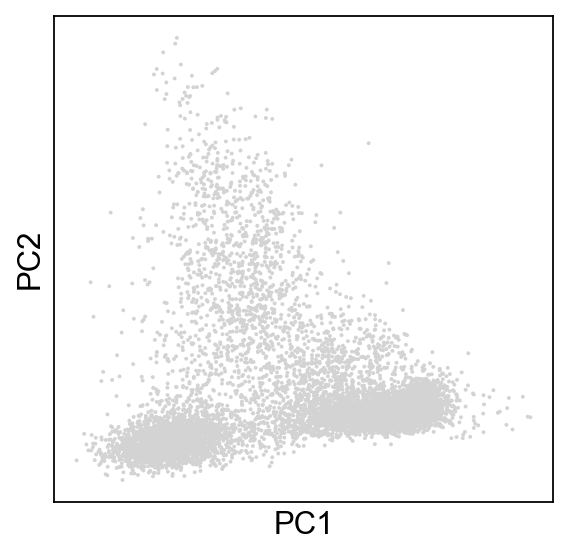

In [73]:
sc.pl.pca_scatter(adata_WT, wspace=0.3)

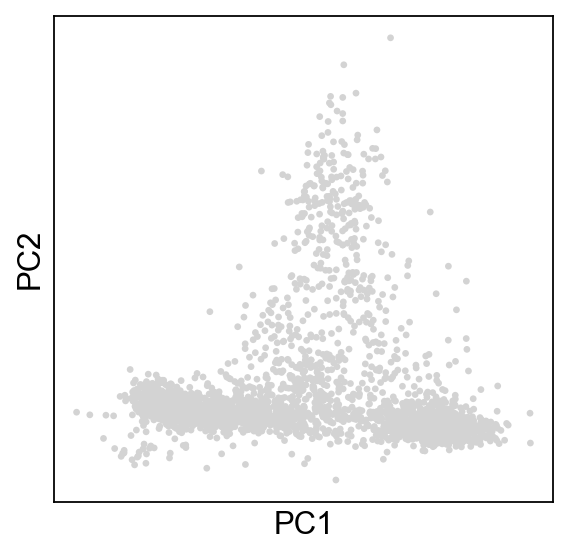

In [74]:
sc.pl.pca_scatter(adata_KO, wspace=0.3)

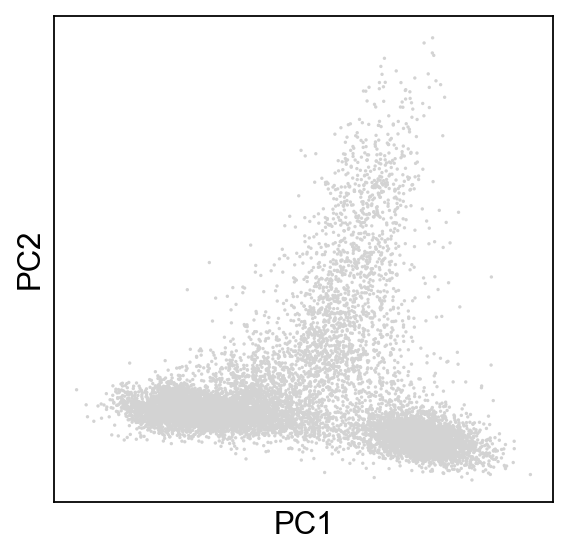

In [75]:
sc.pl.pca_scatter(adata_all_concat, wspace=0.3)

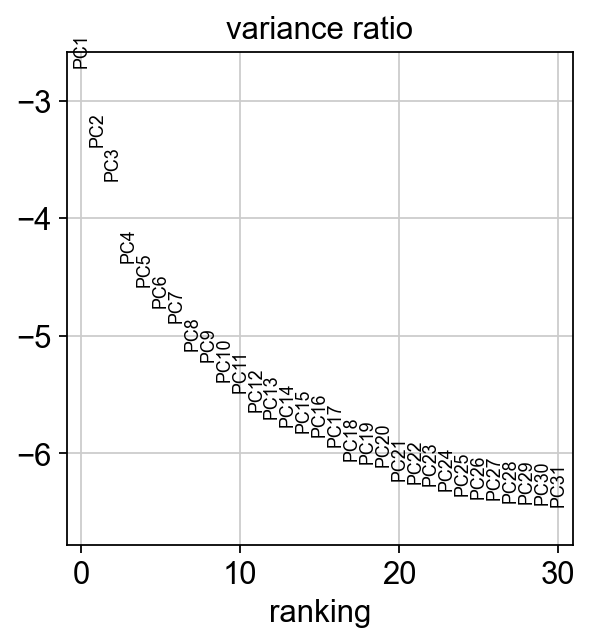

In [76]:
sc.pl.pca_variance_ratio(adata_WT, log=True)

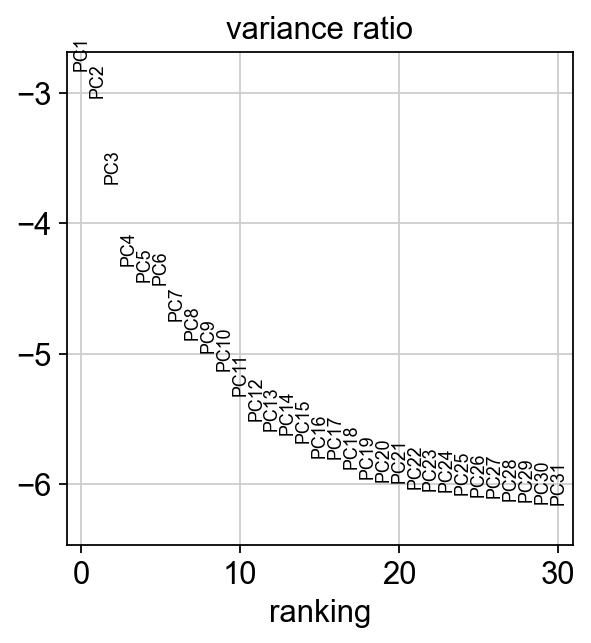

In [77]:
sc.pl.pca_variance_ratio(adata_KO, log=True)

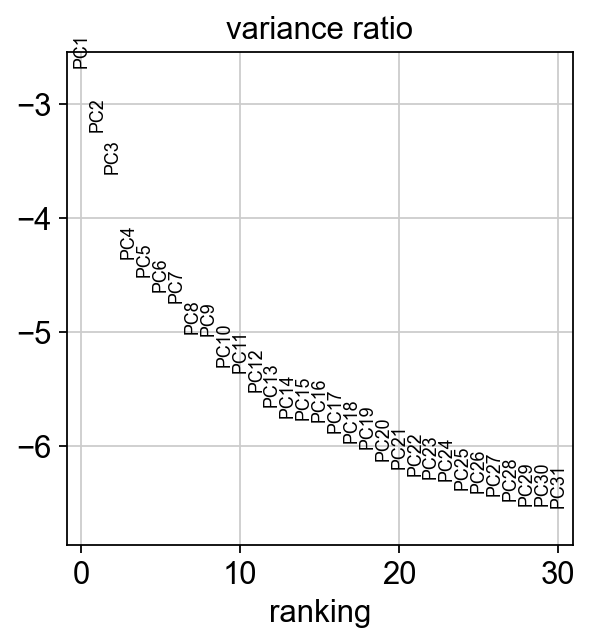

In [78]:
sc.pl.pca_variance_ratio(adata_all_concat, log=True)

In [79]:
sc.pp.neighbors(adata_WT, n_neighbors=10)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)


In [80]:
sc.pp.neighbors(adata_KO, n_neighbors=10)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [81]:
sc.pp.neighbors(adata_all_concat, n_neighbors=10)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [82]:
sc.tl.umap(adata_WT)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


In [83]:
sc.tl.umap(adata_KO)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [84]:
sc.tl.umap(adata_all_concat)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


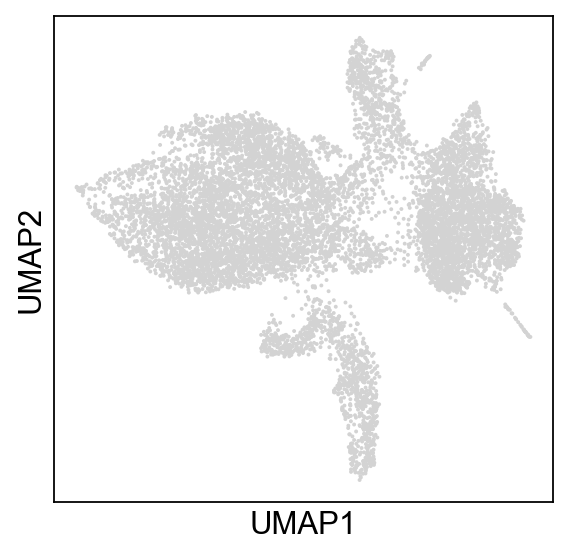

In [85]:
sc.pl.umap(adata_WT, wspace=0.5)

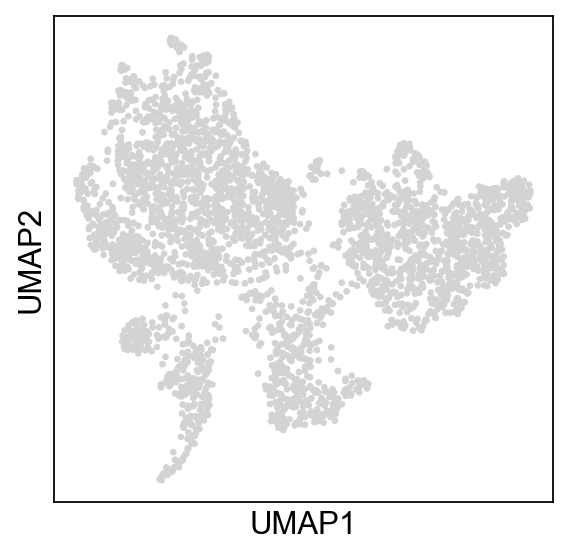

In [86]:
sc.pl.umap(adata_KO, wspace=0.5)

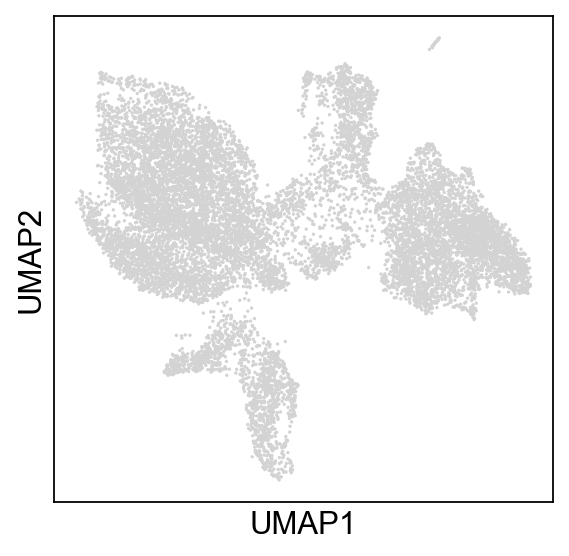

In [87]:
sc.pl.umap(adata_all_concat, wspace=0.5)

## Clustering

In [88]:
sc.tl.louvain(adata_WT, resolution = 0.5, random_state=0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)


In [89]:
sc.tl.louvain(adata_KO, resolution = 0.5, random_state=0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


In [90]:
sc.tl.louvain(adata_all_concat, resolution = 0.5, random_state=0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:02)


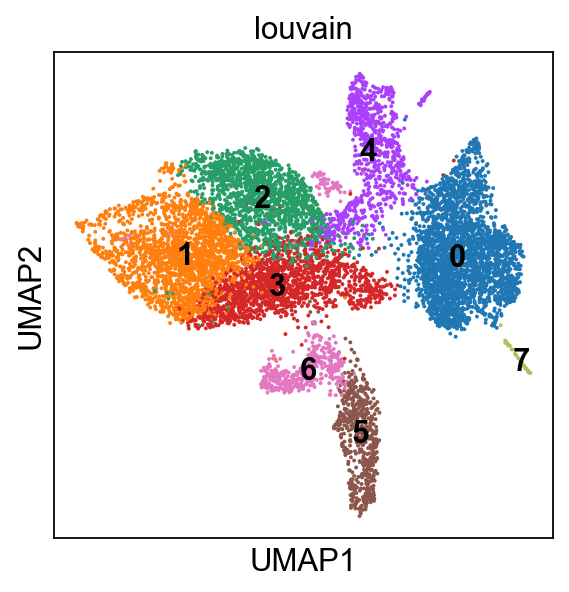

In [91]:
# still batch sees between conditions/days, needs to check whether this needs to be removed
# if Day0 R1 LK and Day0 R2 LK are biological replicates, that means the batch should not be removed
# otherwise, I will do a batch correction
sc.pl.umap(adata_WT, color=['louvain'], wspace=0.4, legend_loc='on data')

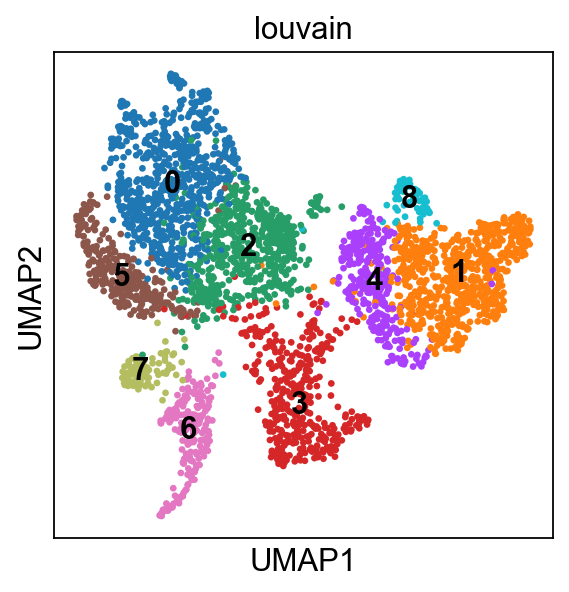

In [92]:
sc.pl.umap(adata_KO, color=['louvain'], wspace=0.7, legend_loc='on data')

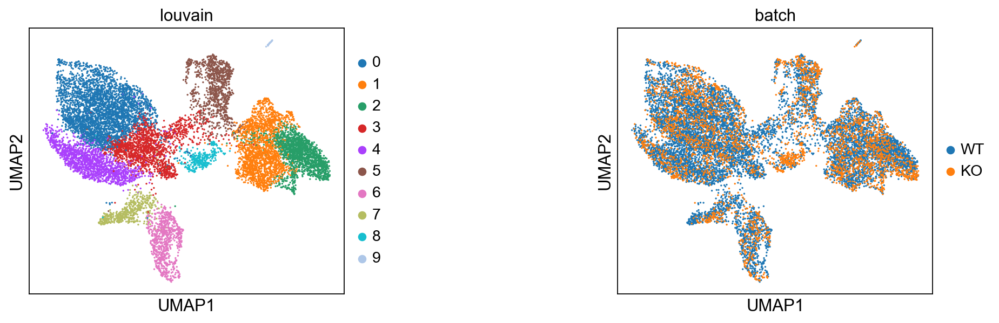

In [93]:
sc.pl.umap(adata_all_concat, color=['louvain','batch'], wspace=0.7)

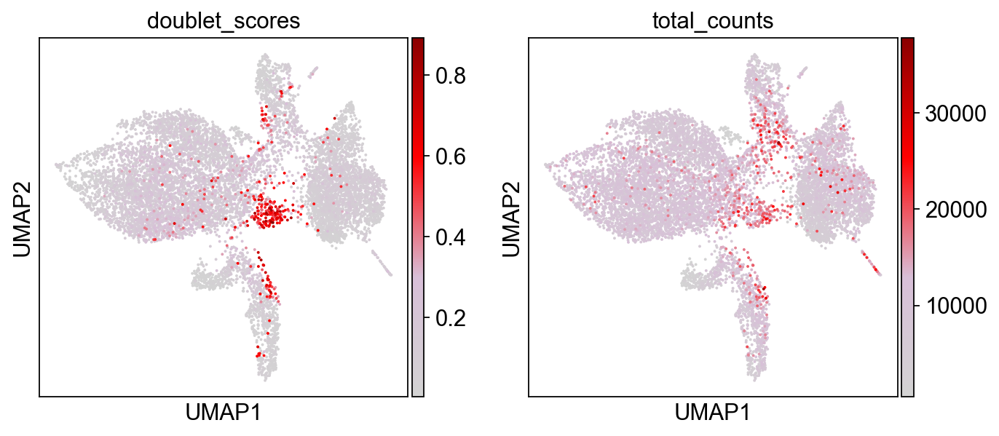

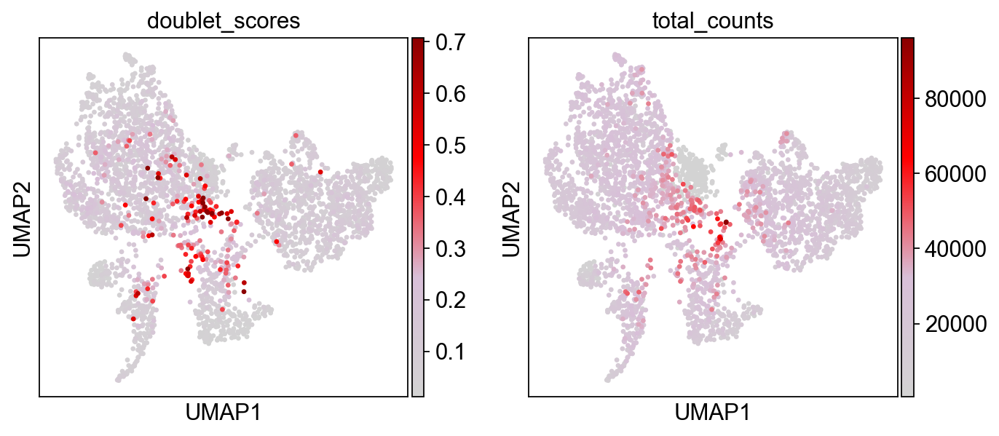

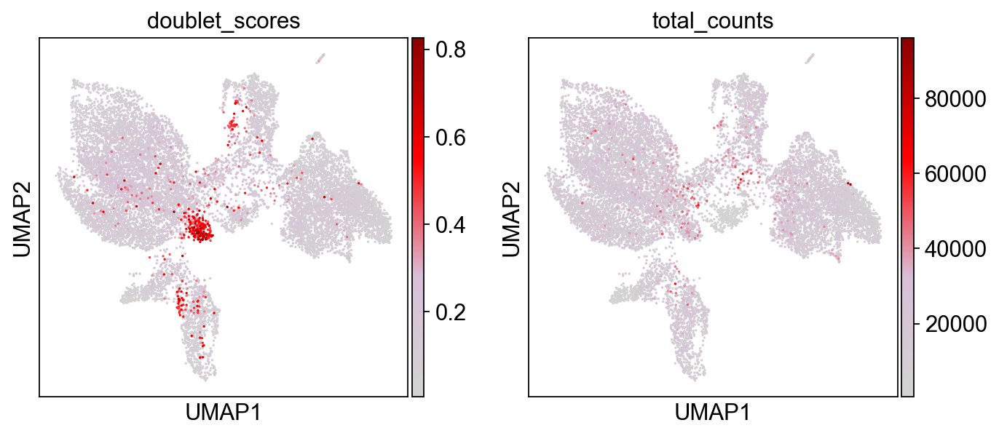

In [94]:
sc.pl.umap(adata_WT, color=['doublet_scores','total_counts'], color_map=cmap)
sc.pl.umap(adata_KO, color=['doublet_scores','total_counts'], color_map=cmap)
sc.pl.umap(adata_all_concat, color=['doublet_scores','total_counts'], color_map=cmap)

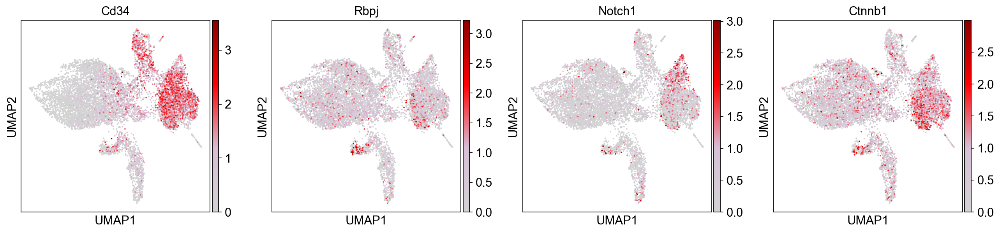

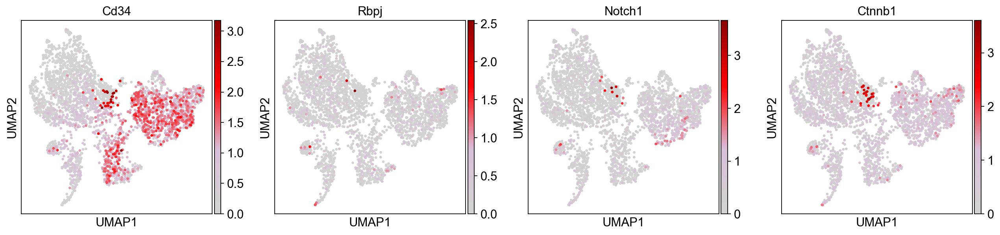

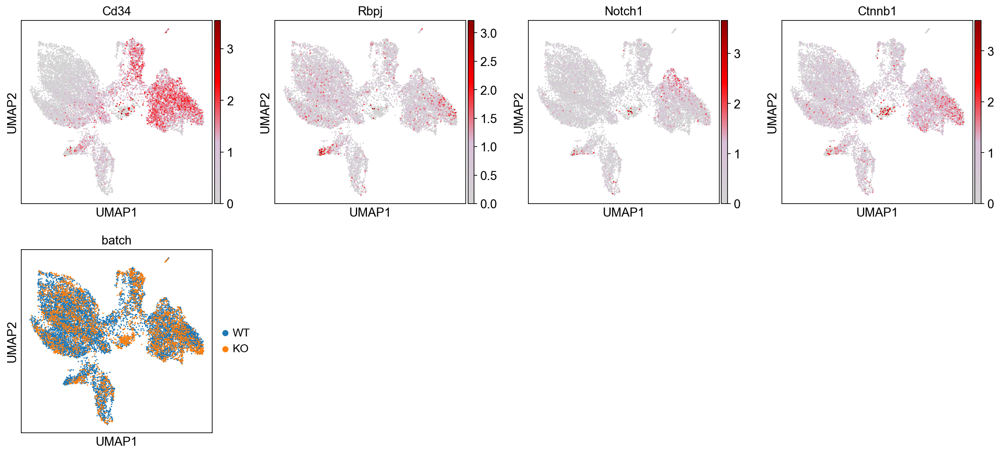

In [95]:
sc.pl.umap(adata_WT, color=['Cd34','Rbpj','Notch1','Ctnnb1'], color_map=cmap)
sc.pl.umap(adata_KO, color=['Cd34','Rbpj','Notch1','Ctnnb1'], color_map=cmap)
sc.pl.umap(adata_all_concat, color=['Cd34','Rbpj','Notch1','Ctnnb1','batch'], color_map=cmap)

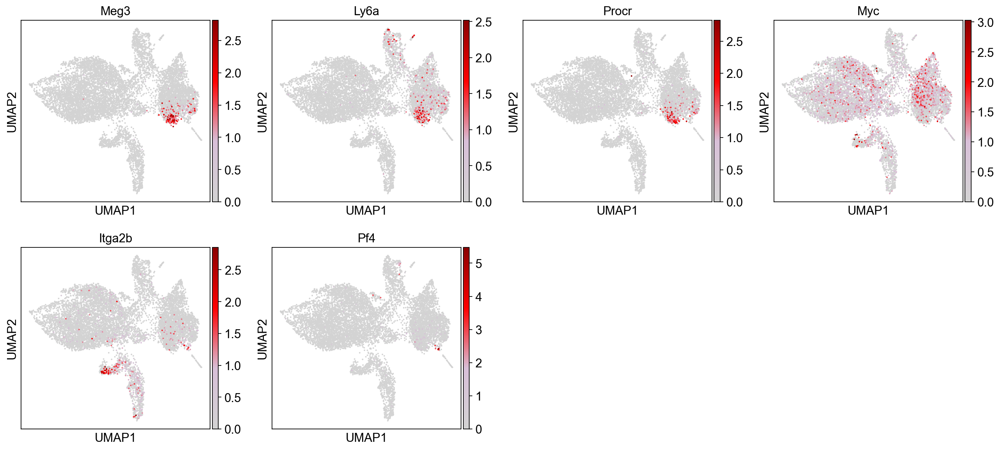

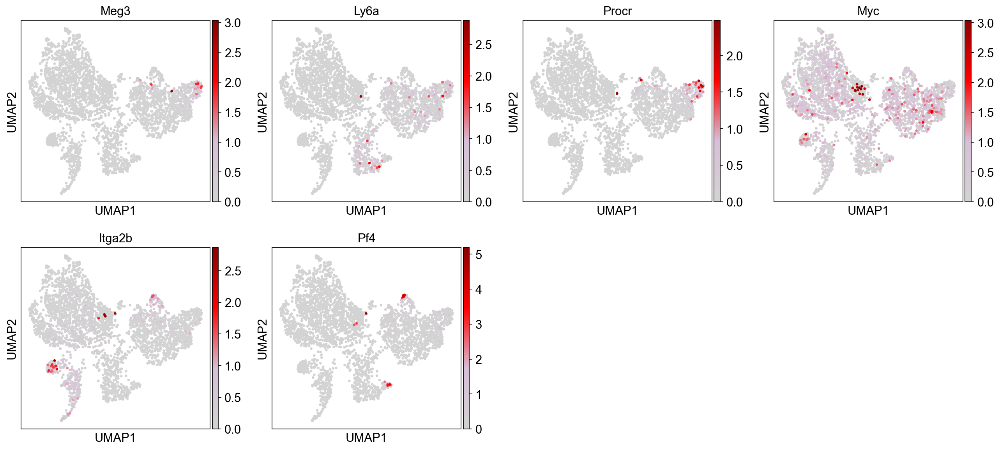

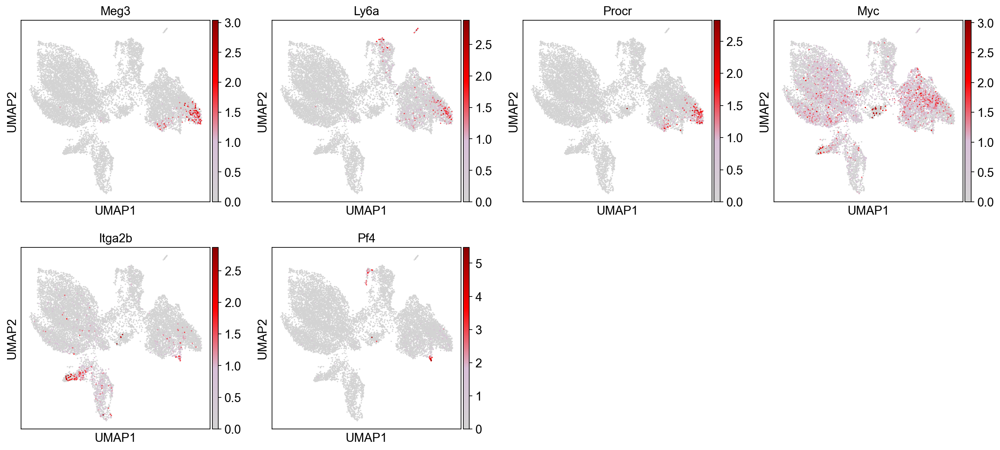

In [96]:
sc.pl.umap(adata_WT, color=['Meg3','Ly6a','Procr','Myc','Itga2b','Pf4'], color_map=cmap)
sc.pl.umap(adata_KO, color=['Meg3','Ly6a','Procr','Myc','Itga2b','Pf4'], color_map=cmap)
sc.pl.umap(adata_all_concat, color=['Meg3','Ly6a','Procr','Myc','Itga2b','Pf4'], color_map=cmap)

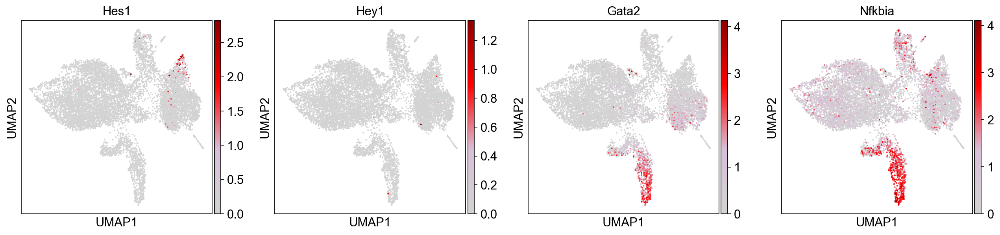

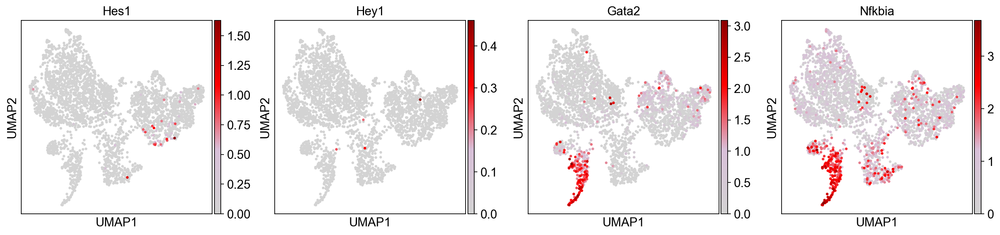

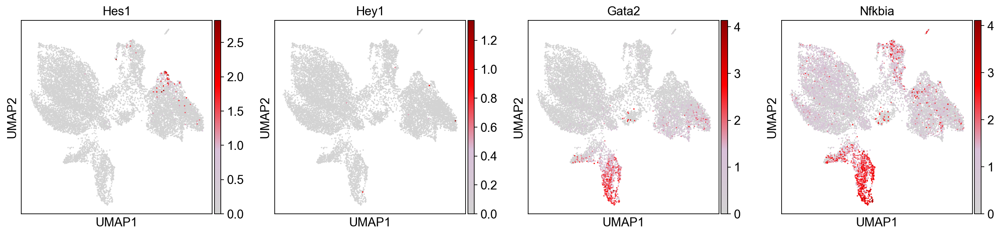

In [97]:
sc.pl.umap(adata_WT, color=['Hes1','Hey1','Gata2','Nfkbia'], color_map=cmap)
sc.pl.umap(adata_KO, color=['Hes1','Hey1','Gata2','Nfkbia'], color_map=cmap)
sc.pl.umap(adata_all_concat, color=['Hes1','Hey1','Gata2','Nfkbia'], color_map=cmap)

In [98]:
sc.tl.rank_genes_groups(adata_WT, 'louvain','wilcoxon',n_genes=500)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


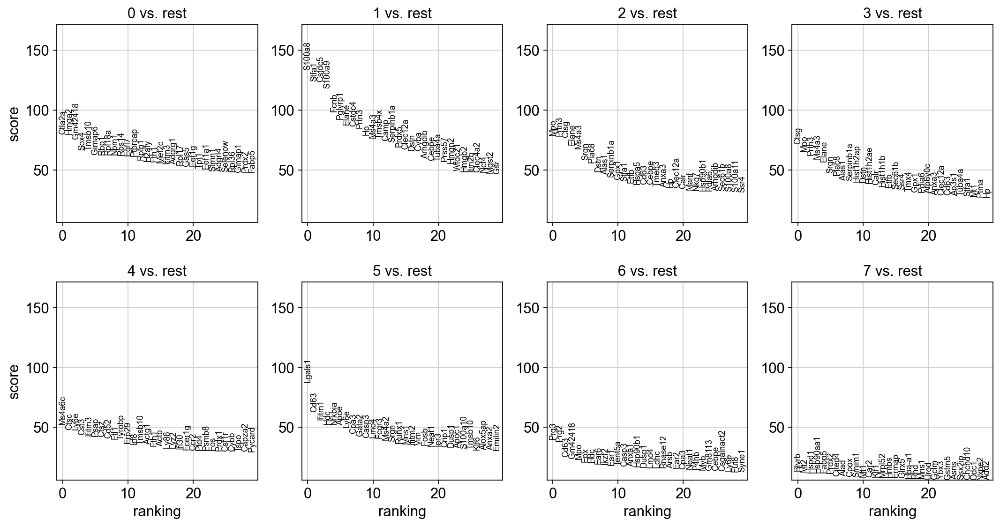

In [99]:
sc.pl.rank_genes_groups(adata_WT, n_genes=30,sharey=True)

In [100]:
degs_WT = adata_WT.uns['rank_genes_groups']
groups_WT = degs_WT['names'].dtype.names
dfdegs_WT = pd.DataFrame({group + '_' + key[:1]: degs_WT[key][group]
             for group in groups_WT for key in ['names','logfoldchanges','pvals_adj']})
print(dfdegs_WT)
#Print dataframe to csv file
export_csv = dfdegs_WT.to_csv ('/Users/yolanda_guillen/Desktop/IMIM/sc_RBPj/Results/DEGs_WT_clusters.csv',header=True,index = False) #Don't forget to add '.csv' at the end of the path

         0_n       0_l           0_p     1_n       1_l           1_p      2_n  \
0     Ctla2a  5.256920  0.000000e+00  S100a8  4.948891  0.000000e+00      Mpo   
1      Hmga2  3.950780  0.000000e+00   Stfa1  4.531809  0.000000e+00    Prtn3   
2    Gm42418  1.826071  0.000000e+00  Cstdc5  4.990931  0.000000e+00     Ctsg   
3       Sox4  3.736187  0.000000e+00  S100a9  5.391778  0.000000e+00    Elane   
4     Tmsb10  2.126262  0.000000e+00    Fcnb  3.883900  0.000000e+00    Ms4a3   
..       ...       ...           ...     ...       ...           ...      ...   
495     Cbr1  1.315734  2.672742e-42    Fgd4  0.829028  5.456754e-17   Eif2s2   
496   Cox4i2  2.437936  4.294142e-42    Myh9  0.408359  5.507105e-17     Dpm3   
497   Armcx6  3.201839  5.457052e-42   Dhrs7  0.720823  5.963024e-17    Ostf1   
498     Nefh  4.541256  1.168582e-41   Dgat1  0.866787  6.248102e-17  Fam173a   
499    Luzp1  2.461378  1.073317e-41    Far2  1.124351  7.458361e-17   Slc8b1   

          2_l           2_p

In [101]:
sc.tl.rank_genes_groups(adata_KO, 'louvain','wilcoxon',n_genes=500)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


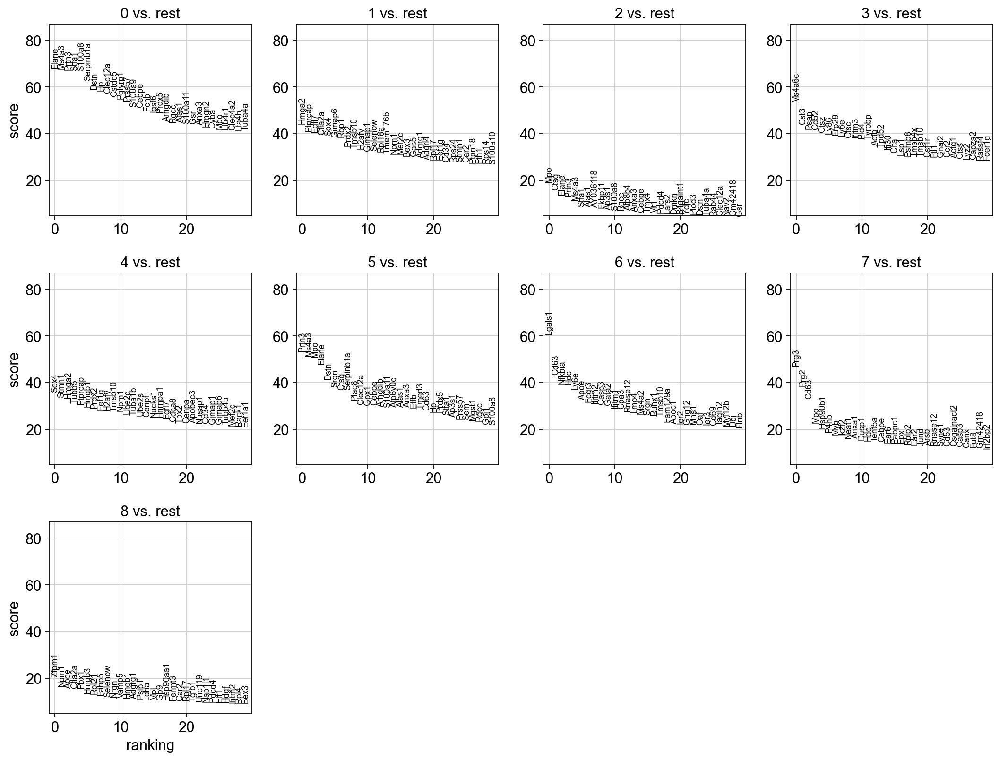

In [102]:
sc.pl.rank_genes_groups(adata_KO, n_genes=30,sharey=True)

In [103]:
degs_KO = adata_KO.uns['rank_genes_groups']
groups_KO = degs_KO['names'].dtype.names
dfdegs_KO = pd.DataFrame({group + '_' + key[:1]: degs_KO[key][group]
             for group in groups_KO for key in ['names','logfoldchanges','pvals_adj']})
print(dfdegs_KO)
#Print dataframe to csv file
export_csv = dfdegs_KO.to_csv ('/Users/yolanda_guillen/Desktop/IMIM/sc_RBPj/Results/DEGs_KO_clusters.csv',header=True,index = False) #Don't forget to add '.csv' at the end of the path

         0_n       0_l           0_p      1_n       1_l            1_p  \
0      Elane  4.345888  0.000000e+00    Hmga2  2.933638  9.617445e-252   
1      Ms4a3  3.302902  0.000000e+00  Ptprcap  2.104717  1.717904e-237   
2      Prtn3  3.442630  0.000000e+00    Egfl7  2.764251  6.611269e-208   
3      Stfa1  5.263439  0.000000e+00   Ctla2a  3.697618  3.449421e-193   
4     S100a8  5.610505  0.000000e+00     Sox4  2.690828  8.764946e-212   
..       ...       ...           ...      ...       ...            ...   
495   Plscr1  1.050726  5.331954e-19   Rnf187  0.692073   5.316473e-22   
496  Atp6v1a  0.648641  4.097338e-19      Tst  1.338261   8.839912e-22   
497     Knl1  0.658396  5.452242e-19   Zfp422  0.747275   6.327939e-22   
498    Tnip1  0.882576  7.370827e-19   Ruvbl1  0.572610   5.722334e-22   
499      Fau  0.167638  2.979014e-19    Atp5b  0.340805   2.577682e-22   

         2_n       2_l           2_p     3_n  ...            5_p      6_n  \
0        Mpo  1.592604  6.313996e-

In [104]:
sc.tl.rank_genes_groups(adata_all_concat, 'louvain','wilcoxon',n_genes=500)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


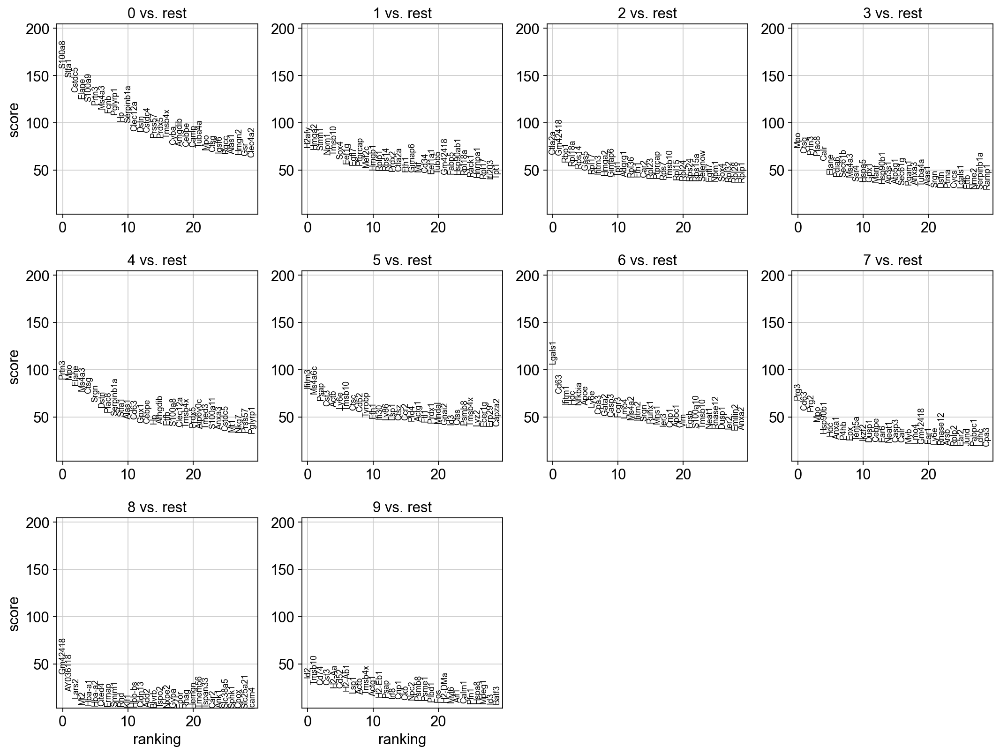

In [105]:
sc.pl.rank_genes_groups(adata_all_concat, n_genes=30,sharey=True)

In [106]:
degs_all_concat = adata_all_concat.uns['rank_genes_groups']
groups_all_concat = degs_all_concat['names'].dtype.names
dfdegs_all_concat = pd.DataFrame({group + '_' + key[:1]: degs_all_concat[key][group]
             for group in groups_all_concat for key in ['names','logfoldchanges','pvals_adj']})
print(dfdegs_all_concat)
#Print dataframe to csv file
export_csv = dfdegs_all_concat.to_csv ('/Users/yolanda_guillen/Desktop/IMIM/sc_RBPj/Results/DEGs_all_concat_clusters.csv',header=True,index = False) #Don't forget to add '.csv' at the end of the p

        0_n       0_l           0_p        1_n       1_l           1_p  \
0    S100a8  5.270724  0.000000e+00      H2afy  1.631831  0.000000e+00   
1     Stfa1  4.864001  0.000000e+00      Hmga2  3.078209  0.000000e+00   
2    Cstdc5  5.098310  0.000000e+00      Stmn1  1.272350  0.000000e+00   
3     Elane  3.956030  0.000000e+00       Npm1  0.932311  0.000000e+00   
4    S100a9  5.277557  0.000000e+00     Tmsb10  1.868776  0.000000e+00   
..      ...       ...           ...        ...       ...           ...   
495    Mpc1  0.429888  8.214789e-35       Cd47  0.402392  5.990810e-49   
496  Sec61b  0.226713  9.373107e-35     Dnajc9  0.600603  1.337822e-48   
497   Wdfy1  0.633537  1.901567e-34  Hnrnpa2b1  0.351958  1.017243e-48   
498    Gmip  0.803781  2.104350e-34       Lsm2  0.503804  1.283123e-48   
499   Igf1r  0.502472  1.881463e-34       Ccl4  1.486037  4.622097e-48   

          2_n       2_l           2_p    3_n  ...            6_p  \
0      Ctla2a  3.751209  0.000000e+00    Mp

In [107]:
## Concatenate filtereD WT and KO to compare clusters with ingest

In [108]:
adata_WT.obs.rename(columns={'louvain': 'louvain_ind'}, inplace=True)
adata_KO.obs.rename(columns={'louvain': 'louvain_ind'}, inplace=True)

In [109]:
adata_concat_ingest = adata_WT.concatenate(adata_KO, batch_categories=['WT', 'KO'])

In [110]:
sc.pp.pca(adata_concat_ingest)
sc.pp.neighbors(adata_concat_ingest)
sc.tl.umap(adata_concat_ingest)

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


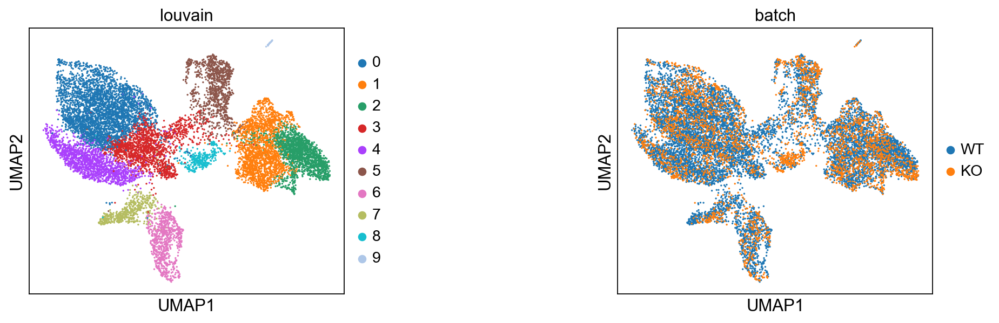

... storing 'louvain_ind' as categorical


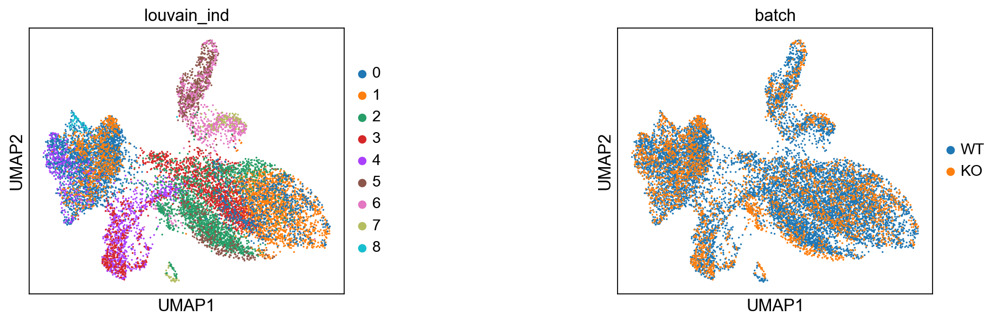

In [111]:
sc.pl.umap(adata_all_concat, color=['louvain','batch'], wspace=0.7)
sc.pl.umap(adata_concat_ingest, color=['louvain_ind','batch'], wspace=0.7)

In [113]:
sc.tl.louvain(adata_concat_ingest, resolution = 0.5, random_state=0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:02)


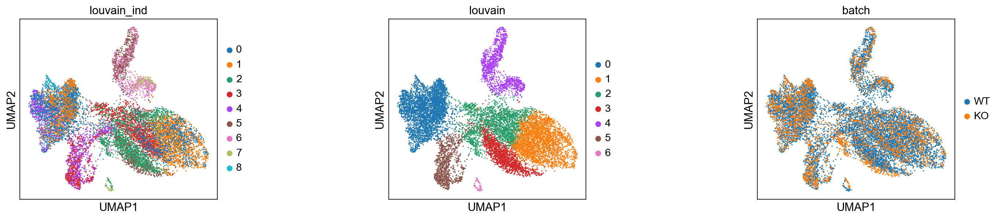

In [114]:
sc.pl.umap(adata_concat_ingest, color=['louvain_ind','louvain','batch'], wspace=0.7)

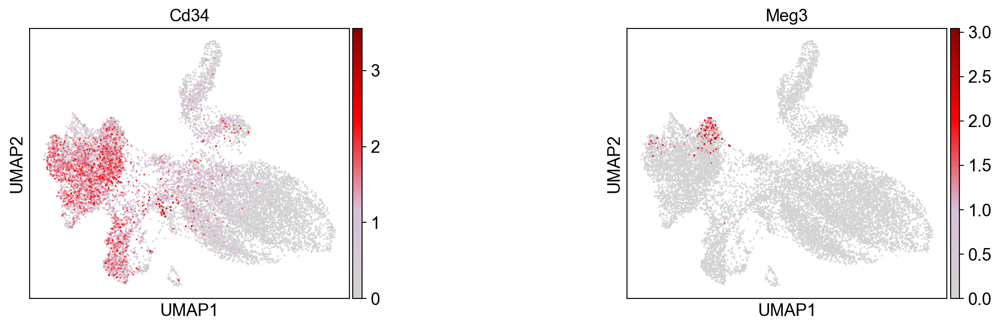

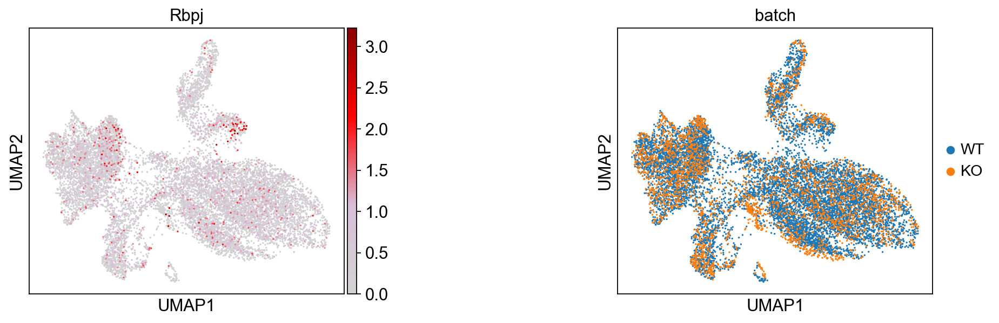

In [115]:
sc.pl.umap(adata_concat_ingest, color=['Cd34','Meg3'],color_map=cmap, wspace=0.7)
sc.pl.umap(adata_concat_ingest, color=['Rbpj','batch'],color_map=cmap, wspace=0.7)

## Embedding data using ingest

In [ ]:
# To use sc.tl.ingest, the datasets need to be defined on the same variables.

In [ ]:
var_names = adata_WT.var_names.intersection(adata_KO.var_names)
adata_WT_in = adata_WT[:, var_names]
adata_KO_in = adata_KO[:, var_names]

In [ ]:
var_names

In [ ]:
# 802 genes represented in both datasets

In [ ]:
sc.pp.pca(adata_WT_in)
sc.pp.neighbors(adata_WT_in)
sc.tl.umap(adata_WT_in)

In [ ]:
sc.pl.umap(adata_WT_in, color=['louvain'], wspace=0.7, legend_loc='on data')

In [ ]:
#sc.pp.pca(adata_KO)
#sc.pp.neighbors(adata_KO)
#sc.tl.umap(adata_KO)
#sc.tl.louvain(adata_KO, resolution = 0.5, random_state=0)

In [ ]:
sc.pl.umap(adata_WT_in, color=['louvain'], wspace=0.7, legend_loc='on data')
sc.pl.umap(adata_KO_in, color=['louvain'], wspace=0.7, legend_loc='on data')

In [ ]:
sc.pl.umap(adata_WT_in, color=['Cd34','Rbpj','Notch1','Ctnnb1'], color_map=cmap)
sc.pl.umap(adata_KO_in, color=['Cd34','Rbpj','Notch1','Ctnnb1'], color_map=cmap)

In [ ]:
adata_WT_in.obs.rename(columns={'louvain': 'louvain_WT'}, inplace=True)
adata_KO_in.obs.rename(columns={'louvain': 'louvain_KO'}, inplace=True)

In [ ]:
sc.tl.ingest(adata_KO_in, adata_WT_in, obs='louvain_WT')

In [ ]:
#adata_KO.uns['louvain_colors'] = adata_WT.uns['louvain_colors']  # fix colors

In [ ]:
sc.pl.umap(adata_KO_in, color=['louvain_KO','louvain_WT','Rbpj','Cd34'], color_map=cmap,wspace=0.5)

In [ ]:
adata_KO_concat = adata_WT_in.concatenate(adata_KO_in, batch_categories=['WT', 'KO'])

In [ ]:
adata_KO_concat.obs.louvain_KO

In [ ]:
adata_WT_in.obs.louvain_WT = adata_WT_in.obs.louvain_WT.astype('category')

In [ ]:
adata_KO_concat.obs.louvain_KO = adata_KO_concat.obs.louvain_KO.astype('category')

In [ ]:
sc.pl.umap(adata_KO_concat, color=['batch', 'louvain_WT','louvain_KO'])

In [ ]:
adata.write('./write/US_B2_v1.h5ad')